## Rendering Xenium histology images with segmentation and gene expression overlay

In [1]:
import os
import sys
from datetime import datetime
today = datetime.today().strftime('%Y-%m-%d')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scanpy as sc
import anndata as ad
#import hdf5plugin

import squidpy as sq
import spatialdata as sd
import spatialdata_plot

# Add repo path to sys path (allows to access scripts and metadata from repo)
repo_path = '/nfs/team205/vk8/projects/thymus_ageing_atlas/Spatial_analyses'
sys.path.insert(1, repo_path) 
sys.path.insert(2, '/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/scripts')

from plotting.colors import thyAgeing_colors, create_list_palette

# Formatting
from matplotlib import font_manager
font_manager.fontManager.addfont("/nfs/team205/ny1/ThymusSpatialAtlas/software/Arial.ttf")
plt.style.use('/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/scripts/plotting/thyAgeing.mplstyle')


/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_excel from `anndata` is deprecated. Import anndata.io.read_excel instead.
  warnings.warn(msg, FutureWarning)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_hdf from `anndata` is deprecated. Import anndata.io.read_hdf instead.
  warnings.warn(msg, FutureWarning)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/s

import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
rcParams['pdf.fonttype'] = 42
sc.settings.set_figure_params(dpi = 150, color_map = 'RdPu', dpi_save = 150, vector_friendly = True, format = 'pdf')

In [2]:
# Define plot and path dirs
plot_path = os.path.join(repo_path, 'plots')
data_path = os.path.join(repo_path, 'data')
model_path = os.path.join(repo_path, 'models')
# Define plot and path dirs
results_path = os.path.join(repo_path, 'results')
general_data_path = '/nfs/team205/vk8/projects/thymus_ageing_atlas/General_analysis/data'

## Load the metadata

In [3]:
spatial_meta_thyage = pd.read_excel(f'{data_path}/ThyAge_spatial_metadata_v3_2025-09-03.xlsx')

In [4]:
xenium_samples = spatial_meta_thyage.loc[spatial_meta_thyage['chemistry_simple'] == 'Xenium', 'SampleID'].tolist()

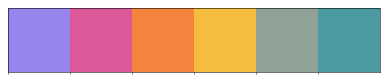

In [5]:
from matplotlib.colors import to_rgb, to_hex, ListedColormap
import colorsys
import seaborn as sns

niche_palette = [thyAgeing_colors['purple'], thyAgeing_colors['magenta'],
                 thyAgeing_colors['orange'], thyAgeing_colors['yellow'],
                 thyAgeing_colors['mint'],thyAgeing_colors['teal']]

def tint_palette(palette, tint_factor=0.5):
    """Tint colors in a palette towards white by tint_factor (0=original, 1=white)."""
    tinted = []
    for c in palette:
        r, g, b = to_rgb(c)
        r = r + (1 - r) * tint_factor
        g = g + (1 - g) * tint_factor
        b = b + (1 - b) * tint_factor
        tinted.append(to_hex((r, g, b)))
    return tinted

def desaturate_palette(palette, saturation_scale=0.7):
    """
    Reduce saturation of hex colors in a palette.
    saturation_scale < 1 decreases saturation, > 1 increases
    """
    new_palette = []
    for c in palette:
        r, g, b = to_rgb(c)                   # convert to 0–1 rgb
        h, l, s = colorsys.rgb_to_hls(r, g, b) # convert to hls
        s = max(0, min(1, s * saturation_scale)) # scale saturation safely
        r2, g2, b2 = colorsys.hls_to_rgb(h, l, s)
        new_palette.append(to_hex((r2, g2, b2)))
    return new_palette

tinted_niche_palette = tint_palette(desaturate_palette(niche_palette, saturation_scale = 0.9), tint_factor=0.2)

sns.palplot(tinted_niche_palette)

In [6]:
from spatialdata import bounding_box_query
def crop_sdata(sdata_obj, xmin, xmax, ymin, ymax):
    return bounding_box_query(
        sdata_obj,
        min_coordinate=[xmin, ymin],
        max_coordinate=[xmax, ymax],
        axes=("x", "y"),
        target_coordinate_system="global",
    )

In [7]:
from typing import Union
def calc_figsize(width : Union[str, float] = 'double',
                 width_ratio : float = 1.0,
                 height : Union[str, float] = 'half',
                 height_ratio : float = 1.0,
                 margin : float = 0.5):
    
    """Calculate figure size in inches based on the width and height of the figure in mm.
    
    Parameters
    ----------
    width : Union[str, float]
        Width of the figure in mm. Default is 89 mm.
    width_ratio : float
        Ratio of the width of the figure. Default is 1.0.
    height : Union[str, float]
        Height of the figure in mm. Default is 117 mm.
    height_ratio : float
        Ratio of the height of the figure. Default is 1.0.
    margin : float
        Margin of the figure in mm. Default is 0.5 mm.
    
    Returns
    -------
    tuple
        Tuple containing the width and height of the figure in inches.
    
    """
    
    # Specify the width and height of the figure in mm
    if width == 'double':
        width = 183
    elif width == 'single':
        width = 89
    elif width == 'one-half':
        width = 130
    width = width * width_ratio - margin # Assuming that panel labels will be left outside the figure
    
    if width > 183:
        print('Width exceeds the maximum width of 183 mm')
    
    if height == 'full':
        height = 247
    elif height == 'half':
        height = 117
    height = height * height_ratio
    
    if height > 247:
        print('Height exceeds the maximum height of 247 mm')
    
    # Convert to inches
    width = width / 25.4
    height = height / 25.4
    
    return (width, height)

In [8]:
def load_xenium_data(sample_id, data_path, spatial_meta, anno_path = f'{data_path}/xenium/annos_v2'):
    data_dir = f'{data_path}/xenium/{sample_id}_xenium.zarr'
    sdata = sd.read_zarr(data_dir)
    sc.pp.filter_cells(sdata.tables["table"], min_counts = 100)
    sc.pp.normalize_total(sdata.tables["table"])
    sc.pp.log1p(sdata.tables["table"])
    sdata.tables["table"].obs = sdata.tables["table"].obs.merge(spatial_meta, how = 'left', on = 'SampleID').copy()
    taa_l2 = pd.read_csv(f'{anno_path}/{sample_id}-taa_l2_v2.csv', index_col = 0)
    taa_l3 = pd.read_csv(f'{anno_path}/{sample_id}-taa_l3.csv', index_col = 0)
    sdata.tables['table'].obs['taa_l2'] = taa_l2.reindex(sdata.tables['table'].obs['cell_id'])['group'].values
    sdata.tables['table'].obs.loc[sdata.tables['table'].obs['taa_l2'].isnull(), 'taa_l2'] = 'none'
    sdata.tables['table'].obs['taa_l2'] = sdata.tables['table'].obs['taa_l2'].astype('category')
    
    sdata.tables['table'].obs['taa_l3'] = taa_l3.reindex(sdata.tables['table'].obs['cell_id'])['group'].values
    sdata.tables['table'].obs.loc[sdata.tables['table'].obs['taa_l3'].isnull(), 'taa_l3'] = 'none'
    sdata.tables['table'].obs['taa_l3'] = sdata.tables['table'].obs['taa_l3'].astype('category')
    sdata.tables["table"].obs_names = sdata.tables["table"].obs["Sample_hr"]+'-'+sdata.tables["table"].obs["cell_id"]
    return sdata

In [9]:
def load_xenium_data_v2(sample_id, data_path, spatial_meta, anno_path = f'{data_path}/xenium/annos_v3/ThyAge_xenium_adata_paed+adult_CellCharter_knn_manual_annos_filt_2025-10-21.csv'):
    data_dir = f'{data_path}/xenium/{sample_id}_xenium.zarr'
    sdata = sd.read_zarr(data_dir)
    sc.pp.filter_cells(sdata.tables["table"], min_counts = 100)
    sc.pp.normalize_total(sdata.tables["table"])
    sc.pp.log1p(sdata.tables["table"])
    sdata.tables["table"].obs = sdata.tables["table"].obs.merge(spatial_meta, how = 'left', on = 'SampleID').copy()
    sdata.tables["table"].obs_names = sdata.tables["table"].obs["Sample_hr"]+'-'+sdata.tables["table"].obs["cell_id"]
    ## Integrated annotation from new csv
    new_anno = pd.read_csv(anno_path, index_col = 0)
    sdata.tables["table"].obs[['taa_l2_v2', 'taa_l3', 'niche_cellcharter3_v2', 'niche_cellcharter6']] = new_anno.reindex(sdata.tables["table"].obs_names)[['taa_l2_v2', 'taa_l3', 'niche_cellcharter3_v2', 'niche_cellcharter6']].copy()
    sdata.tables["table"].obs.rename(columns = {'taa_l2_v2':'taa_l2'}, inplace = True)
    ## format columns so they are plotted correctly
    sdata.tables['table'].obs.loc[sdata.tables['table'].obs['taa_l2'].isnull(), 'taa_l2'] = 'none'
    sdata.tables['table'].obs['taa_l2'] = sdata.tables['table'].obs['taa_l2'].astype('category')
    sdata.tables['table'].obs.loc[sdata.tables['table'].obs['taa_l3'].isnull(), 'taa_l3'] = 'none'
    sdata.tables['table'].obs['taa_l3'] = sdata.tables['table'].obs['taa_l3'].astype('category')
    return sdata

In [48]:
f'{data_path}/xenium/annos_v3/ThyAge_xenium_adata_paed+adult_CellCharter_knn_manual_annos_filt_2025-10-21.csv'

'/nfs/team205/vk8/projects/thymus_ageing_atlas/Spatial_analyses/data/xenium/annos_v3/ThyAge_xenium_adata_paed+adult_CellCharter_knn_manual_annos_filt_2025-10-21.csv'

anno_l2 = pd.read_csv(f'{data_path}/xenium/annos_v2/A72-THY-0-FFPE-1-taa_l2_v2.csv', index_col = 0)
anno_l3 = pd.read_csv(f'{data_path}/xenium/annos_v2/A72-THY-0-FFPE-1-taa_l3.csv', index_col = 0)

a72_sdata.tables["table"].obs['taa_l2'] = anno_l2.reindex(a72_sdata.tables["table"].obs['cell_id'])['group'].values

a72_sdata.tables["table"].obs['taa_l3'] = anno_l3.reindex(a72_sdata.tables["table"].obs['cell_id'])['group'].values

In [7]:
xenium_samples

['Z16-THY-0-FF-1',
 'Z17-THY-0-FF-1',
 'A45-THY-0-FFPE-1',
 'A67-THY-0-FFPE-1',
 'A72-THY-0-FFPE-1',
 'A70-THY-0-FFPE-2']

In [10]:
a72_sdata = load_xenium_data_v2(sample_id = 'A72-THY-0-FFPE-1', data_path = data_path, 
                             spatial_meta = spatial_meta_thyage, 
                             anno_path = f'{data_path}/xenium/annos_v3/ThyAge_xenium_adata_paed+adult_CellCharter_knn_manual_annos_filt_2025-10-21.csv')

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


Quite time-consuming, would only run once to pick the coordinates for plotting later 

INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.394063821607074].


CPU times: user 6min 19s, sys: 2min 3s, total: 8min 22s
Wall time: 4min 1s


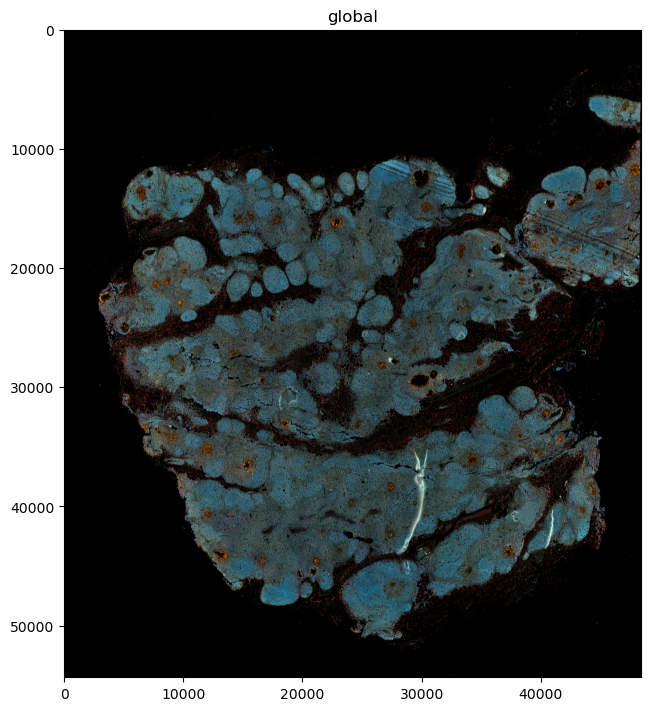

In [10]:
%%time
a72_sdata.pl.render_images(scale = 'scale5').pl.show(figsize=(7, 7))

x: 12_000, 18_000
y: 32_000, 38_000

## Lymphoid follicle

### Prep image

In [12]:
%%time
### One of the most time-consuming steps
lymph_crop = crop_sdata(a72_sdata, xmin = 13500, xmax = 15500, ymin = 35000, ymax=36500)

CPU times: user 22min 46s, sys: 6min 28s, total: 29min 15s
Wall time: 10min 42s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.5158938869665513].


CPU times: user 862 ms, sys: 518 ms, total: 1.38 s
Wall time: 1.55 s


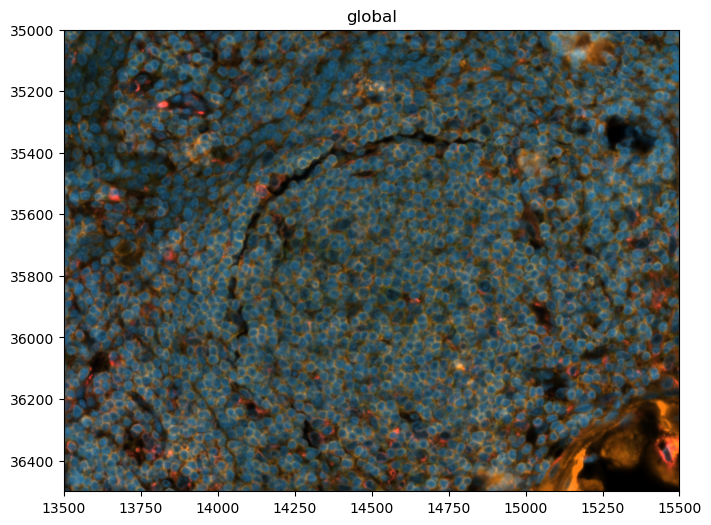

In [13]:
%%time
lymph_crop.pl.render_images(scale = 'scale1').pl.show(figsize=(7, 7))

In [14]:
lymph_crop["table"].obs["region"] = "cell_labels"

In [15]:
lymph_crop.set_table_annotates_spatialelement(table_name="table", region="cell_labels", 
                                              region_key="region", instance_key="cell_labels")


/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:480: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


In [16]:
lymph_crop

SpatialData object
├── Images
│     └── 'morphology_focus': DataTree[cyx] (5, 1500, 2000), (5, 750, 1000), (5, 375, 500), (5, 188, 250), (5, 94, 125)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (1500, 2000), (750, 1000), (375, 500), (188, 250), (94, 125)
│     └── 'nucleus_labels': DataTree[yx] (1500, 2000), (750, 1000), (375, 500), (188, 250), (94, 125)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (2806, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (2704, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (2738, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (2532, 5001)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (Points), cell_boundaries (Shapes), cell_circles (Shapes), nucleus_boundaries (Shapes)

In [17]:
lymph_crop.tables["table"]

AnnData object with n_obs × n_vars = 2532 × 5001
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'genomic_control_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'nucleus_count', 'segmentation_method', 'region', 'z_level', 'cell_labels', 'SampleID', 'n_counts', 'Sample', 'Sample_hr', 'Path', 'donor', 'donor_type', 'age_group', 'age_misc', 'age_numeric', 'age_months', 'Sex', 'Source', 'SlideID', 'Position', 'section_thickness (um)', 'permebialisation(min)', 'RIN/DV200', 'Block', 'Block_type', 'chemistry_simple', 'chemistry_detail', 'Probeset', 'Number of genes', 'Study', 'Study_name', 'published', 'QC', 'Batch', 'RawData', 'Sequencer', 'Spaceranger', 'reference', 'annotation_path', 'annotation_version', 'annotator', 'taa_l2', 'taa_l3', 'niche_cellcharter3_v2', 'niche_cellcharter6'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs', 'log1p'
    obsm: 'spa

In [20]:
lymph_crop["table"].uns['spatialdata_attrs']['region']

'cell_labels'

In [21]:
lymph_crop["table"].uns['spatialdata_attrs']['region_key']

'region'

In [22]:
lymph_crop["table"].uns['spatialdata_attrs']['instance_key']

'cell_labels'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.399507881584006].


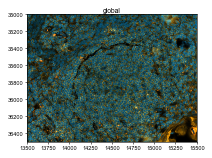

In [52]:
lymph_crop.pl.render_images(scale = 'scale1').pl.show(figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_lymph_follicle_histology.pdf')

### Cell segmentation

In [19]:
lymph_crop['table'].obs['taa_l3'].unique().to_numpy()   

array(['mcTEC', 'mTECI', 'none', 'T_CD8αα', 'T_CD8_recirc', 'B_mem',
       'EC-ven', 'B_plasma', 'T_CD8', 'T_Treg_recirc', 'T_DP', 'mTECIII',
       'T_CD4_recirc', 'Fb-interm', 'T_αβT(entry)', 'T_CD4', 'B_GC-like',
       'B_naive', 'T_Treg', 'aDC', 'Fb-med', 'Fb-perilo', 'DC1', 'EC-cap',
       'DC2', 'TEC-mim', 'cTEC', 'Mac', 'ILC', 'mTECII', 'EC-art', 'pDC',
       'Mono', 'SMC', 'Pericyte', 'Fb-interlo', 'Mast', 'TEC-EMT', 'T_DN'],
      dtype=object)

In [20]:
lymph_crop['table'].obs['taa_mod'] = lymph_crop['table'].obs['taa_l3'].astype(str).copy()
lymph_crop['table'].obs['taa_mod'] = lymph_crop['table'].obs['taa_mod'].apply(lambda x: 'B_med' if x == 'B_GC-like' else 'DC' if 'DC' in x else 'Vasc' if 'EC' in x else 'Fb' if 'Fb' in x else 'TEC' if 'TEC' in x else 'T_dev' if x in ['T_DN', 'T_DP','T_αβT(entry)'] else 'T_innate' if x in ['ILC','T_CD8αα'] else 'Vasc' if x in ['SMC', 'Pericyte'] else x)


/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


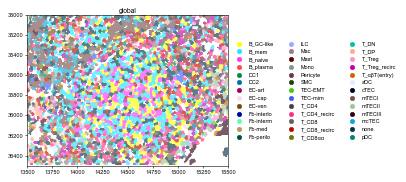

In [58]:
lymph_crop.pl.render_labels(element = 'cell_labels', color = 'taa_l3').pl.show(coordinate_systems="global", figsize=calc_figsize(width = 130, height = 55), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_lymph_follicle_taa_l3_segmentation.pdf')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.399507881584006].


INFO     Rasterizing image for faster rendering.                                                                   


/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


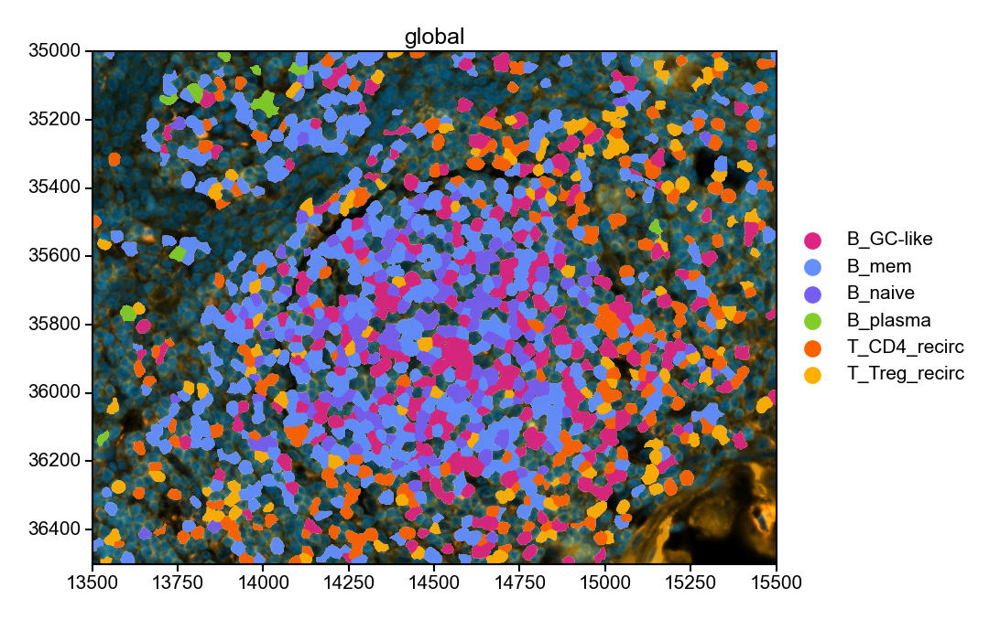

In [116]:
lymph_crop.pl.render_images(scale = 'scale1').pl.render_labels(element = 'cell_labels', color = 'taa_l3',
                            groups = ['B_GC-like', 'B_mem', 'B_naive', 'B_plasma', 'T_CD4_recirc', 'T_Treg_recirc'], fill_alpha = 0.8, 
                            palette = create_list_palette(thyAgeing_colors, ['magenta', 'blue', 'purple', 'grass', 'orange', 'yellow'])) \
                            .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 90, height = 75), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_lymph_follicle_taa_l3_segmentation_selection.pdf', dpi = 300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.399507881584006].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


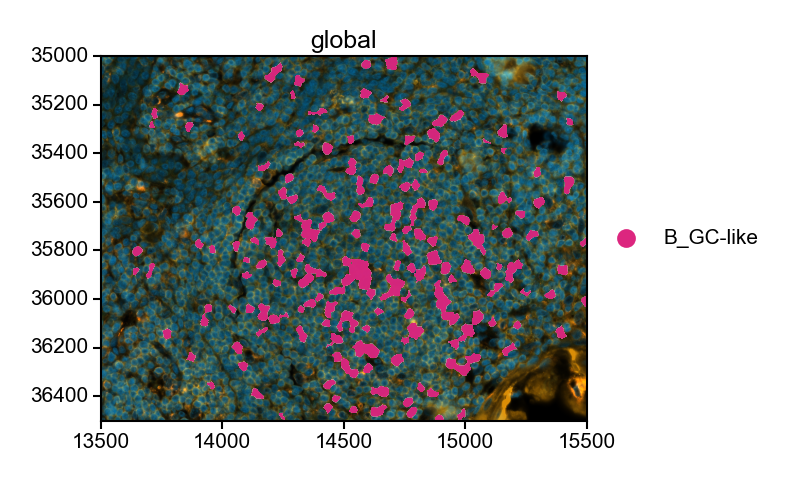

In [ ]:
# B med only
lymph_crop.pl.render_images(scale = 'scale1').pl.render_labels(element = 'cell_labels', color = 'taa_l3',
                            groups = ['B_GC-like'], fill_alpha = 0.8, 
                            palette = create_list_palette(thyAgeing_colors, ['magenta'])) \
                            .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_lymph_follicle_taa_l3_segmentation_Bmed.pdf', dpi = 300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.5158938869665513].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


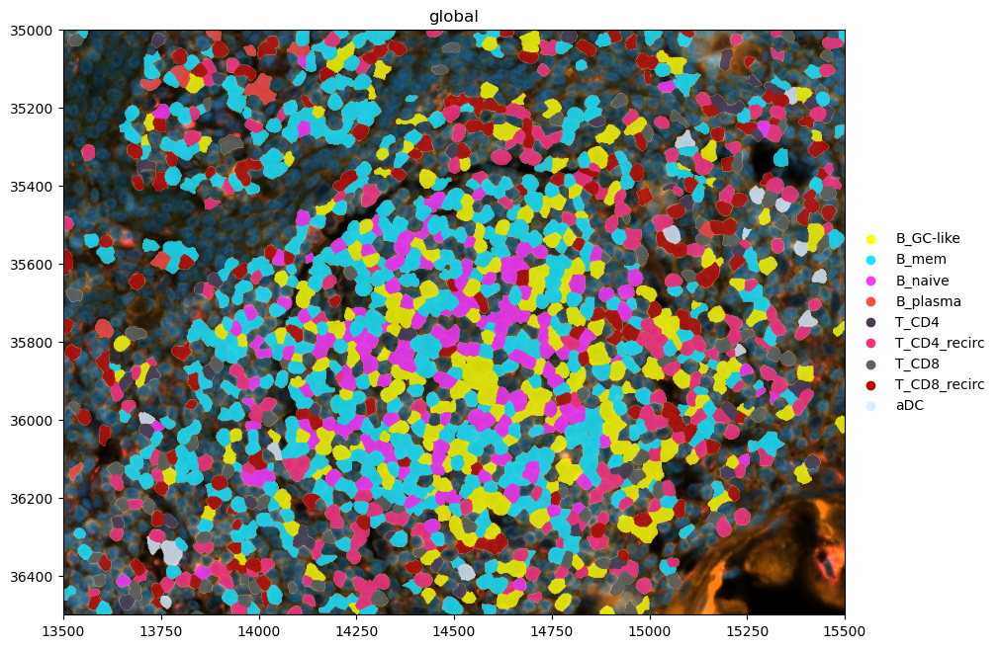

In [29]:
lymph_crop.pl.render_images(scale = 'scale1').pl.render_labels(element = 'cell_labels', color = 'taa_l3', 
groups = ['B_naive', 'B_mem', 'B_GC-like', 'B_plasma', 'T_CD4',
       'T_CD4_recirc', 'T_CD8', 'T_CD8_recirc', 'aDC'], fill_alpha = 0.58).pl.show(coordinate_systems="global", figsize=(10, 10), save = f'{plot_path}/A72_lymph_follicle_Xen_image_overlaid_taa_l3_segmentation.pdf')

### Marker genes

In [54]:
gene_names = ['CXCL13', 'CXCR5', 'AICDA', 'CD40LG', 'AIRE']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.399507881584006].


INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 


/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/_core/anndata.py:401: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/anndata/_core/aligned_df.py:68: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata/_core/_elements.py:106: UserWarning: Key `transcripts` already exists. Overwriting it in-memory.
  self._check_key(key, self.keys(), self._shared_keys)
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to

CPU times: user 2.07 s, sys: 444 ms, total: 2.52 s
Wall time: 2.07 s


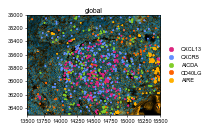

In [56]:
%%time
lymph_crop.pl.render_images(scale = 'scale1').pl.render_points(
    "transcripts",
    color="feature_name",
    groups=gene_names, 
    palette = create_list_palette(thyAgeing_colors, ['magenta', 'blue', 'grass', 'orange', 'yellow'])
   # palette="orange",
).pl.show(coordinate_systems="global", figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_lymph_follicle_transcripts.pdf')

## Render the niches

In [38]:
lymph_crop.tables['table'].obs.loc[lymph_crop.tables['table'].obs['niche_cellcharter6'].isnull(), 'niche_cellcharter6'] = 'none'

lymph_crop.tables['table'].obs['niche_cellcharter6'] = lymph_crop.tables['table'].obs['niche_cellcharter6'].astype('category')

In [39]:
lymph_crop.tables['table'].obs.loc[lymph_crop.tables['table'].obs['niche_cellcharter3_v2'].isnull(), 'niche_cellcharter3_v2'] = 'none'
lymph_crop.tables['table'].obs['niche_cellcharter3_v2'] = lymph_crop.tables['table'].obs['niche_cellcharter3_v2'].astype('category')

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


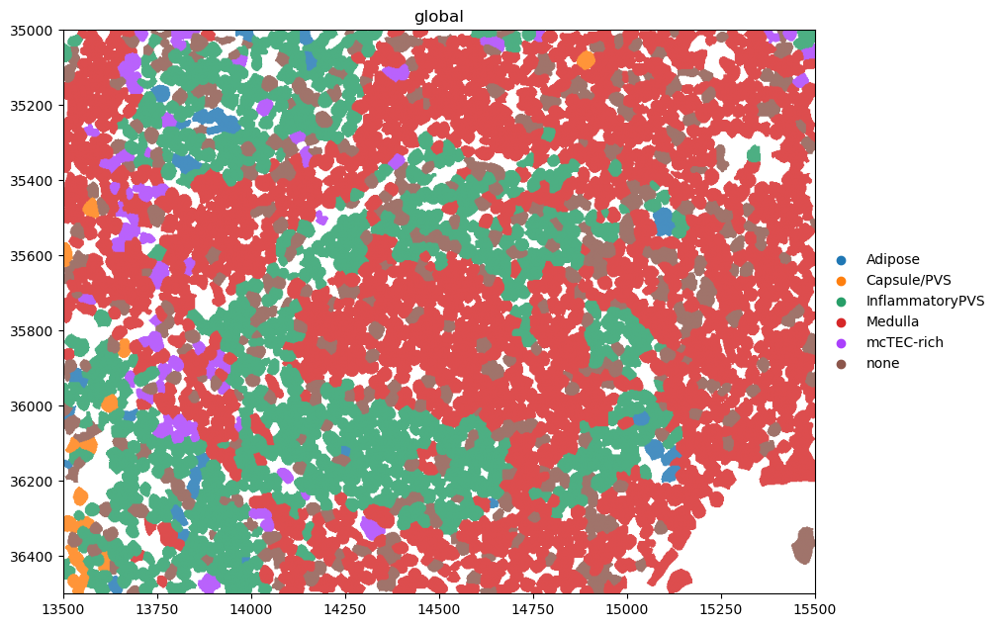

In [43]:
lymph_crop.pl.render_labels(element = 'cell_labels', color = 'niche_cellcharter6', fill_alpha = 0.58).pl.show(coordinate_systems="global", figsize=(10, 10), save = f'{plot_path}/A72_lymph_follicle_Xen_image_overlaid_niches_segmentation.pdf')

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


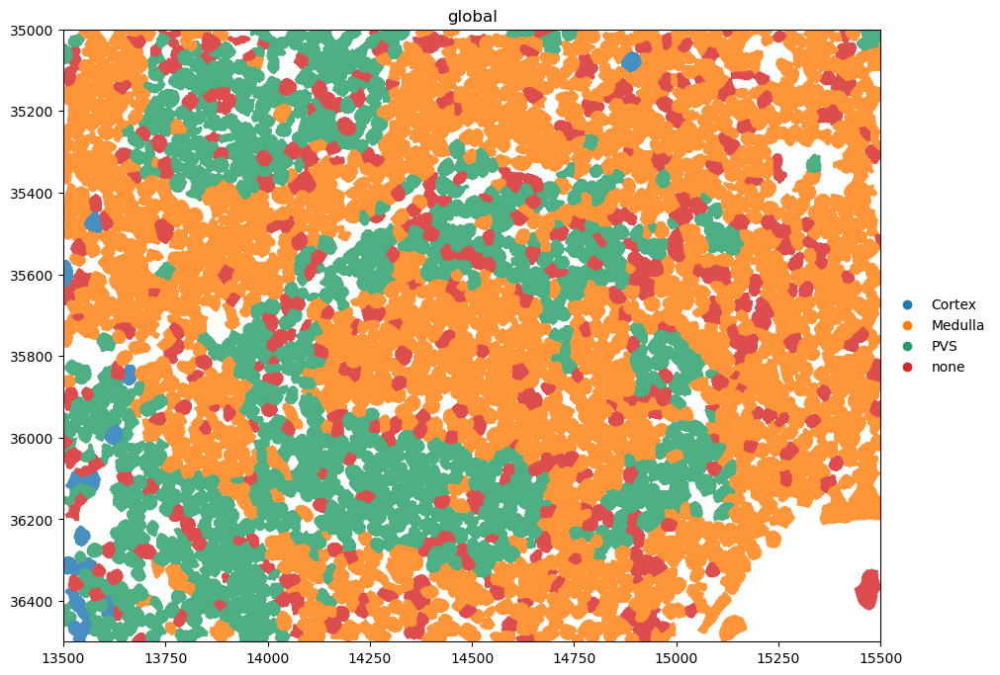

In [45]:
lymph_crop.pl.render_labels(element = 'cell_labels', color = 'niche_cellcharter3_v2', fill_alpha = 0.58).pl.show(coordinate_systems="global", figsize=(10, 10), save = f'{plot_path}/A72_lymph_follicle_Xen_image_overlaid_compartments_segmentation.pdf')

## Inflammatory PVS

Donor A72, Selection 2, Areas (µm^2): 178131.6
- Selection 2,3543.155969877304,9492.90249731366
- Selection 2,3091.395945314668,9492.90249731366
- Selection 2,3091.395945314668,9098.596764947915
- Selection 2,3543.155969877304,9098.596764947915
- Selection 2,3543.155969877304,9492.90249731366

In [78]:
# Cropping the data
inflammatory_crop = crop_sdata(a72_sdata, xmin = 15000, xmax = 16800, ymin = 43000, ymax=44800)

In [80]:
inflammatory_crop

SpatialData object
├── Images
│     └── 'morphology_focus': DataTree[cyx] (5, 1800, 1800), (5, 900, 900), (5, 450, 450), (5, 225, 225), (5, 113, 113)
├── Labels
│     ├── 'cell_labels': DataTree[yx] (1800, 1800), (900, 900), (450, 450), (225, 225), (113, 113)
│     └── 'nucleus_labels': DataTree[yx] (1800, 1800), (900, 900), (450, 450), (225, 225), (113, 113)
├── Points
│     └── 'transcripts': DataFrame with shape: (<Delayed>, 13) (3D points)
├── Shapes
│     ├── 'cell_boundaries': GeoDataFrame shape: (3084, 1) (2D shapes)
│     ├── 'cell_circles': GeoDataFrame shape: (2970, 2) (2D shapes)
│     └── 'nucleus_boundaries': GeoDataFrame shape: (2982, 1) (2D shapes)
└── Tables
      └── 'table': AnnData (2747, 5001)
with coordinate systems:
    ▸ 'global', with elements:
        morphology_focus (Images), cell_labels (Labels), nucleus_labels (Labels), transcripts (Points), cell_boundaries (Shapes), cell_circles (Shapes), nucleus_boundaries (Shapes)

In [ ]:
inflammatory_crop["table"].obs["region"] = "cell_labels"

inflammatory_crop.set_table_annotates_spatialelement(table_name="table", region="cell_labels", 
                                              region_key="region", instance_key="cell_labels")

inflammatory_crop.tables['table'].obs.loc[inflammatory_crop.tables['table'].obs['niche_cellcharter6'].isnull(), 'niche_cellcharter6'] = 'none'
inflammatory_crop.tables['table'].obs['niche_cellcharter6'] = inflammatory_crop.tables['table'].obs['niche_cellcharter6'].astype('category')
inflammatory_crop.tables['table'].obs['niche_cellcharter6'] = pd.Categorical(inflammatory_crop.tables['table'].obs['niche_cellcharter6'], categories = ['Capsule/PVS',
 'Cortex',
 'Medulla',
 'InflammatoryPVS',
 'mcTEC-rich',
 'Adipose'])

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:480: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5378700499807765e-05..1.5292579777008841].


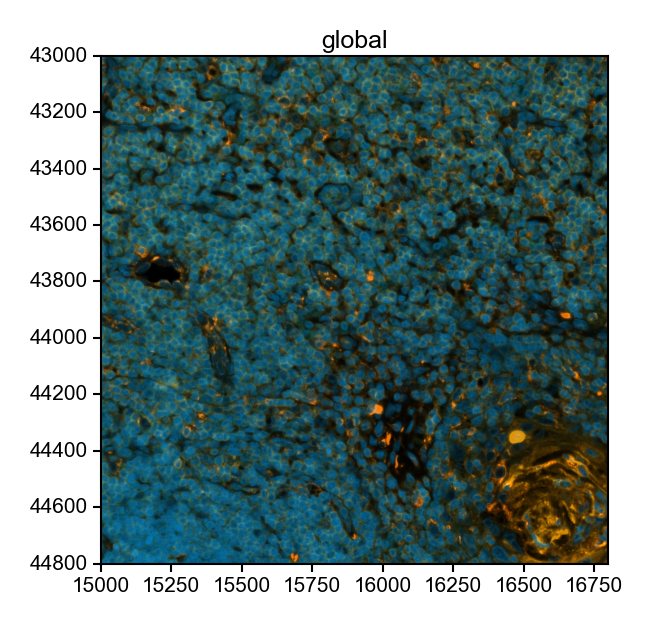

In [79]:
inflammatory_crop.pl.render_images(scale = 'scale1').pl.show(figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_inflammatory_histology.pdf', dpi = 300)

In [96]:
inflammatory_crop.tables['table'].obs['niche_cellcharter6'].cat.categories

Index(['Adipose', 'Capsule/PVS', 'Cortex', 'InflammatoryPVS', 'Medulla',
       'mcTEC-rich', 'none'],
      dtype='object')

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


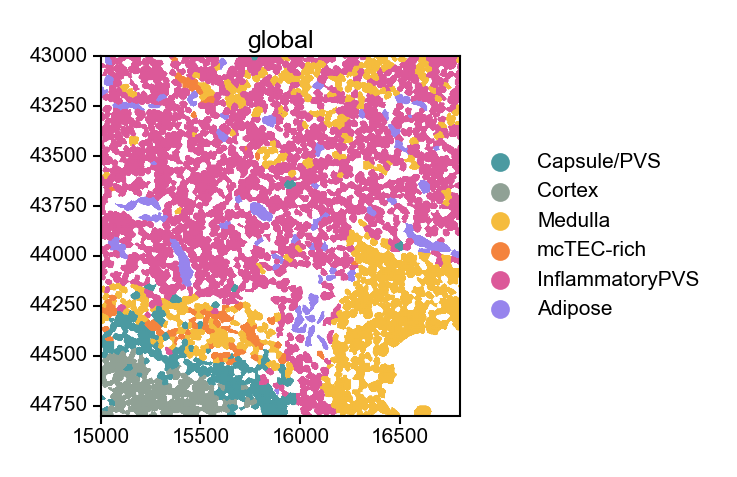

In [109]:
inflammatory_crop.pl.render_labels(element = 'cell_labels', color = 'niche_cellcharter6', fill_alpha = 1,
                                   palette = tinted_niche_palette[::-1],
                                   groups = ['Capsule/PVS','Cortex','Medulla', 'mcTEC-rich','InflammatoryPVS', 'Adipose']) \
    .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 60, height = 75), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_inflammatory_niches.pdf', dpi =300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5378700499807765e-05..1.5292579777008841].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


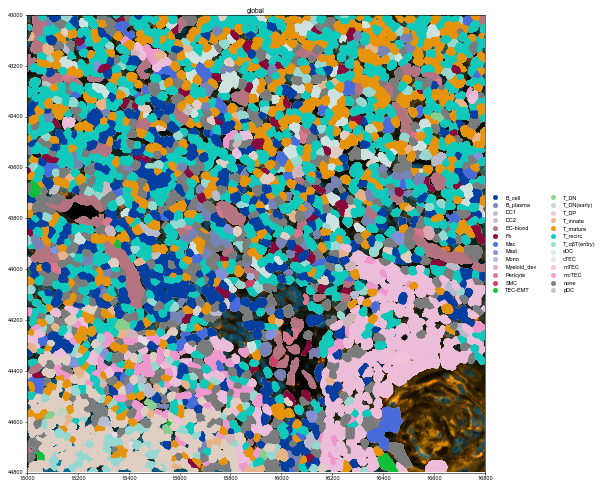

In [88]:
inflammatory_crop.pl.render_images(scale = 'scale1')\
    .pl.render_labels(element = 'cell_labels', color = 'taa_l2', fill_alpha = 0.8,
                      #groups = ['B_cell', 'B_plasma', 'T_recirc', 'Fb', 'DC1', 'DC2', 'Mac', 'Mono']
                      ) \
    .pl.show(coordinate_systems="global")

In [90]:
thyAgeing_colors.keys()

dict_keys(['blue', 'purple', 'magenta', 'orange', 'yellow', 'teal', 'mint', 'pink', 'grass', 'forest'])

In [110]:
inflammatory_crop.tables['table'].obs['new_anno'] = inflammatory_crop.tables['table'].obs['taa_l2'].copy().astype(str)
inflammatory_crop.tables['table'].obs['new_anno'] = inflammatory_crop.tables['table'].obs['new_anno'].apply(lambda x: 'DC' if 'DC' in x else x)
inflammatory_crop.tables['table'].obs['new_anno'] = pd.Categorical(inflammatory_crop.tables['table'].obs['new_anno'])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5378700499807765e-05..1.5292579777008841].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


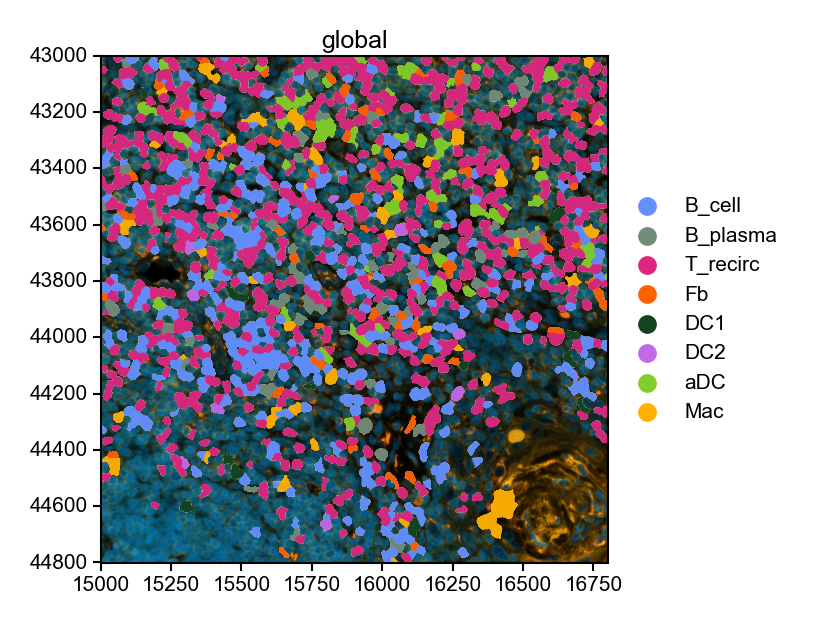

In [94]:
inflammatory_crop.pl.render_images(scale = 'scale1')\
    .pl.render_labels(element = 'cell_labels', color = 'taa_l2', fill_alpha = 0.8,
                      groups = ['B_cell', 'B_plasma', 'T_recirc', 'Fb', 'DC1', 'DC2', 'aDC','Mac'],
                      palette = create_list_palette(thyAgeing_colors, ['blue', 'mint', 'magenta', 'orange', 'forest', 'pink', 'grass', 'yellow'])) \
    .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_inflammatory_taa_l2_segmentation.pdf', dpi = 300)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [1.5378700499807765e-05..1.5292579777008841].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


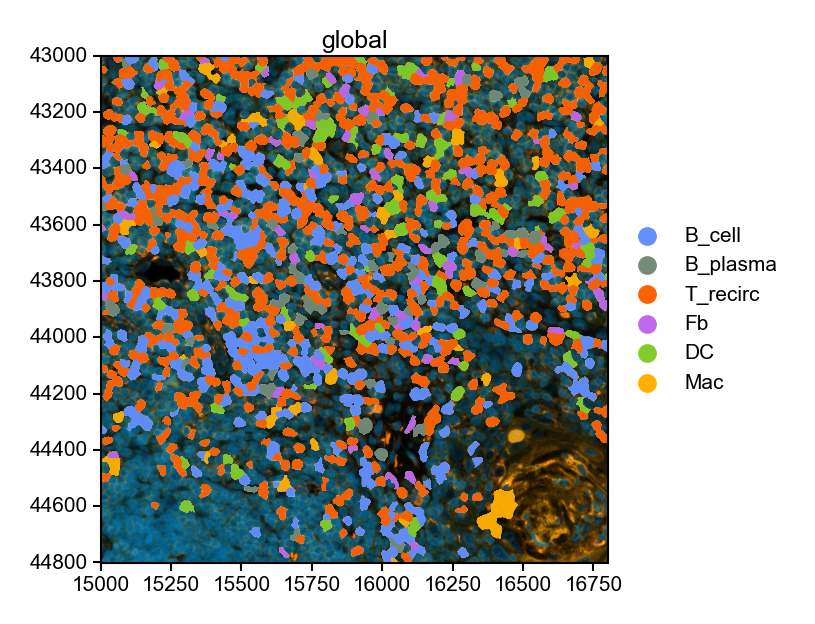

In [113]:
inflammatory_crop.pl.render_images(scale = 'scale1')\
    .pl.render_labels(element = 'cell_labels', color = 'new_anno', fill_alpha = 0.8,
                      groups = ['B_cell', 'B_plasma', 'T_recirc', 'Fb', 'DC','Mac'],
                      palette = create_list_palette(thyAgeing_colors, ['blue', 'mint', 'orange', 'pink', 'grass', 'yellow'])) \
    .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 65, height = 50), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_inflammatory_taa_l2_segmentation.pdf', dpi = 300)

## pDC dev

In [14]:
%%time
### One of the most time-consuming steps
pdc_crop = crop_sdata(a72_sdata, xmin = 11000, xmax = 13700, ymin = 37800, ymax=40500)

CPU times: user 19min 49s, sys: 5min 51s, total: 25min 40s
Wall time: 6min 57s


In [13]:
40500-37800

2700

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1580315263360248].


CPU times: user 743 ms, sys: 169 ms, total: 912 ms
Wall time: 696 ms


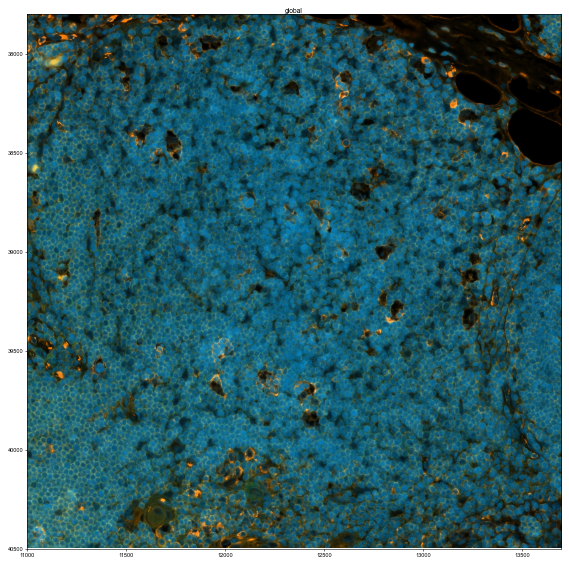

In [15]:
%%time
pdc_crop.pl.render_images(scale = 'scale1').pl.show(figsize=(7, 7))

In [20]:
pdc_crop["table"].obs["region"] = "cell_labels"
pdc_crop.set_table_annotates_spatialelement(table_name="table", region="cell_labels", 
                                              region_key="region", instance_key="cell_labels")

/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata/_core/spatialdata.py:480: UserWarning: Converting `region_key: region` to categorical dtype.
  convert_region_column_to_categorical(table)


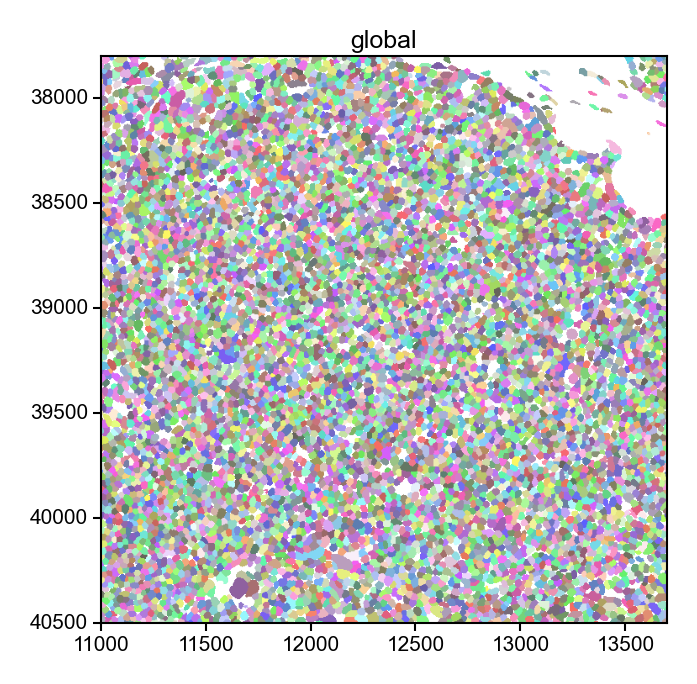

In [16]:
pdc_crop.pl.render_labels(element = 'cell_labels', color = 'taa_l3').pl.show(coordinate_systems="global", figsize=calc_figsize(width = 130, height = 55), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_pDC_taa_l3_segmentation.pdf', dpi = 300)

In [18]:
create_list_palette(thyAgeing_colors, ['magenta', 'purple', 'grass', 'orange'])

['#DC267F', '#785EF0', '#82CD29', '#FE6100']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1580315263360248].
/nfs/team205/vk8/mambaforge/envs/squidpy-env3/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:778: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


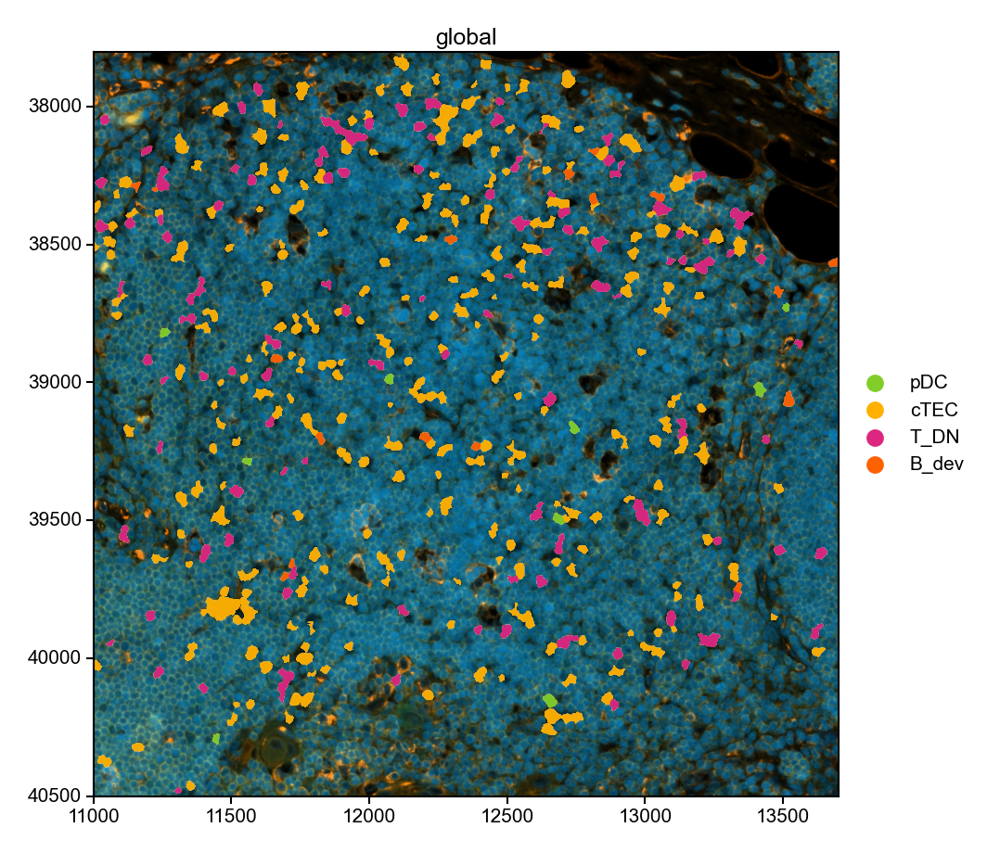

In [24]:
pdc_crop.pl.render_images(scale = 'scale1').pl.render_labels(element = 'cell_labels', color = 'taa_l3',
                            groups = ['pDC', 'cTEC', 'T_DN', 'B_dev'], fill_alpha = 0.8, 
                            palette = create_list_palette(thyAgeing_colors, ['grass', 'yellow', 'magenta', 'orange'])
                            ) \
                            .pl.show(coordinate_systems="global", figsize=calc_figsize(width = 90, height = 75), save = f'/nfs/team205/lm25/thymus_projects/thymus_ageing_atlas/General_analysis/plots/spatialPlots/A72_pDC_taa_l3_segmentation_selection.pdf', dpi = 300)